# FMT Project

**Submitted by:** Harsh Pundhir

### CONTEXT
A complex modern semiconductor manufacturing process is normally under constant surveillance via the monitoring of signals/
variables collected from sensors and or process measurement points. However, not all of these signals are equally valuable in a specific monitoring system. 
The measured signals contain a combination of useful information, irrelevant information as well as noise. Engineers 
typically have a much larger number of signals than are actually required. If we consider each type of signal as a feature, then feature selection may be applied to identify the most relevant signals. The Process Engineers may then use these signals to determine key factors contributing to yield excursions downstream in the process. 
This will enable an increase in process throughput, decreased time to learning and reduce the per unit production costs. These signals can be used as features to predict the yield type. And by analysing and trying out different combinations of features, essential signals that are impacting the yield type can be identified

### DATA DESCRIPTION
The data consists of 1567 examples each with 591 features. 
The dataset presented in this case represents a selection of such features where each example represents a single production entity with 
associated measured features and the labels represent a simple pass/fail yield for in house line testing. Target column “ –1” corresponds to 
a pass and “1” corresponds to a fail and the data time stamp is for that specific test point.

### PROJECT OBJECTIVE
To build a classifier to predict the Pass/Fail yield of a particular process entity and analyse whether all the 
features are required to build the model or not

## Solution

### 1. Importing libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes = True)

df = pd.read_csv('signal-data.csv')
df.head()

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1


In [2]:
df.shape

(1567, 592)

#### 1.1 Exploring Dtypes

In [3]:
df.dtypes

Time          object
0            float64
1            float64
2            float64
3            float64
              ...   
586          float64
587          float64
588          float64
589          float64
Pass/Fail      int64
Length: 592, dtype: object

- Time seems like a non-numeric type, exploring more below to ensure if any other non-numeric columns exist.

In [4]:
df.select_dtypes(exclude=np.number)

,Time
0,2008-07-19 11:55:00
1,2008-07-19 12:32:00
2,2008-07-19 13:17:00
3,2008-07-19 14:43:00
4,2008-07-19 15:22:00
...,...
1562,2008-10-16 15:13:00
1563,2008-10-16 20:49:00
1564,2008-10-17 05:26:00
1565,2008-10-17 06:01:00


In [5]:
df.drop('Time',axis=1, inplace=True)

In [6]:
df.select_dtypes(exclude=np.number)

""
0
1
2
3
4
...
1562
1563
1564
1565


- Time is the only non numeric type entry.

#### 1.2 Dealing with null values

In [7]:
df.isnull().sum().sum()

41951

In [8]:
for i in df.columns:
    df[i]=df[i].fillna(df[i].median())
    
df.isnull().sum().sum()

0

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
0,1567.0,3014.441551,73.480841,2743.2400,2966.66500,3011.4900,3056.5400,3356.3500
1,1567.0,2495.866110,80.228143,2158.7500,2452.88500,2499.4050,2538.7450,2846.4400
2,1567.0,2200.551958,29.380973,2060.6600,2181.09995,2201.0667,2218.0555,2315.2667
3,1567.0,1395.383474,439.837330,0.0000,1083.88580,1285.2144,1590.1699,3715.0417
4,1567.0,4.171281,56.103721,0.6815,1.01770,1.3168,1.5188,1114.5366
...,...,...,...,...,...,...,...,...
586,1567.0,0.021458,0.012354,-0.0169,0.01345,0.0205,0.0276,0.1028
587,1567.0,0.016474,0.008805,0.0032,0.01060,0.0148,0.0203,0.0799
588,1567.0,0.005283,0.002866,0.0010,0.00330,0.0046,0.0064,0.0286
589,1567.0,99.652345,93.864558,0.0000,44.36860,71.9005,114.7497,737.3048


- Columns have  ranges of values
- pass/fail column seems highly unbalanced (as 75% quantile is -1 and max is 1)

### 2. Dealing with Curse of multidemsionality

- **Lasso** regression was used to reduce the variables for further data processing

#### 2.1 Lasso feature reduction

In [10]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

X = df.drop('Pass/Fail',axis=1)
y = df['Pass/Fail']

X_scaled = preprocessing.scale(X)
X_scaled = pd.DataFrame(X_scaled, columns=X.columns)  # ideally the training and test should be 

y_scaled = preprocessing.scale(y)
y_scaled = pd.DataFrame(y_scaled) 

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.30, random_state=1)
X_train

,0,1,2,3,4,5,6,7,8,9,...,580,581,582,583,584,585,586,587,588,589
390,-0.335181,-0.771373,-0.697829,-0.828563,-0.060885,0.0,0.578201,0.086779,1.674752,0.585470,...,-0.138300,-0.179550,-1.439158,-0.099993,0.068209,-0.088549,-0.895347,-0.928632,-1.006144,-0.211519
635,0.042044,0.351908,0.017525,-1.171606,-0.049148,0.0,0.874975,-0.081142,-1.230736,0.022620,...,-0.138300,-0.179550,-0.087073,-0.327147,-0.335226,-0.312697,0.918372,0.798245,0.529476,-0.299666
78,0.251145,0.061643,-0.582830,0.425705,-0.050123,0.0,-0.336659,0.243505,-0.018422,-0.169411,...,0.264800,0.568245,-1.174619,-0.169887,-0.066269,-0.161652,-0.482402,0.139305,0.075770,0.157302
733,0.319620,-1.675335,0.354963,0.402746,-0.056180,0.0,0.820379,0.042000,0.843065,3.154714,...,-0.138300,-0.179550,-1.057047,0.191229,0.095104,0.191979,0.975051,-0.917271,-0.796741,-0.793982
1262,-0.432517,0.569607,-0.921402,-0.567633,-0.057610,0.0,0.473487,0.321868,-1.173845,-1.308354,...,-0.138300,-0.179550,-1.527337,-0.041749,-0.146956,-0.034350,-0.628148,1.832099,1.925493,1.468650
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,0.757289,-0.456920,0.543353,-1.192028,-0.052325,0.0,1.026230,-0.271452,-0.682147,-1.262001,...,-0.138300,-0.179550,-1.115833,-0.000978,-0.039374,0.005334,-1.154450,0.514219,0.424774,2.047770
905,-0.896731,0.378091,0.542975,-0.645535,-0.059444,0.0,-0.182005,-0.148310,0.075041,0.141812,...,-0.692563,-0.495768,1.382585,-0.204833,-0.254539,-0.202231,-0.028972,-0.565079,-0.587339,-0.481445
1096,0.658047,-0.056808,2.256648,1.466488,-0.044851,0.0,-1.009694,-0.025168,-0.974728,0.406683,...,-1.297213,-0.679623,0.588970,-0.245605,-0.120061,-0.240824,-0.288075,-0.974076,-1.006144,-0.591817
235,0.425668,-0.070024,-0.098992,-0.337392,-0.060350,0.0,-0.192573,-0.170700,-0.503348,-2.215535,...,-0.138300,-0.179550,-1.586124,-0.187360,-0.012478,-0.174992,-2.012728,-0.815022,-0.796741,1.840423


In [11]:
y_train

,0
390,-0.266621
635,-0.266621
78,-0.266621
733,-0.266621
1262,-0.266621
...,...
715,-0.266621
905,-0.266621
1096,-0.266621
235,3.750641


In [12]:
from sklearn.linear_model import Lasso, LogisticRegression
from sklearn.feature_selection import SelectFromModel

sel_ = SelectFromModel(Lasso(alpha=0.05))
sel_.fit(X_train, y_train)
sel_.get_support()

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True,  True, False, False,  True, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False,  True, False, False,  True, False,
        True, False,

In [13]:
selected_feat = X_train.columns[(sel_.get_support())]
print('total features: {}'.format((X_train.shape[1])))
print('selected features: {}'.format(len(selected_feat)))
print('features with coefficients shrank to zero: {}'.format(np.sum(sel_.estimator_.coef_ == 0)))

total features: 590
selected features: 32
features with coefficients shrank to zero: 558


In [14]:
selected_feat

Index(['21', '40', '59', '75', '86', '99', '100', '103', '114', '121', '124',
       '126', '129', '130', '183', '195', '214', '249', '295', '344', '348',
       '349', '360', '365', '431', '437', '460', '480', '510', '557', '569',
       '575'],
      dtype='object')

In [15]:
df[selected_feat]

,21,40,59,75,86,99,100,103,114,121,...,360,365,431,437,460,480,510,557,569,575
0,-5419.00,61.29,-1.7264,0.0126,2.3895,-0.0251,0.0002,-0.0042,0.0,15.88,...,0.0065,0.0170,33.1562,3.1136,29.9394,115.7408,64.6707,1.0297,16.98835,0.1026
1,-5441.50,78.25,0.8073,-0.0039,2.3754,-0.0158,-0.0004,-0.0045,0.0,15.88,...,0.0005,0.0053,2.2655,3.2153,40.4475,163.0249,141.4365,1.7819,16.98835,0.0772
2,-5447.75,14.37,23.8245,-0.0078,2.4532,0.1218,0.0006,-0.0026,0.0,15.90,...,0.0046,0.0054,29.1663,3.1281,32.3594,93.9245,240.7767,1.1386,68.84890,0.0640
3,-5468.25,76.90,24.3791,-0.0555,2.4004,-0.0195,-0.0002,-0.0059,0.0,15.55,...,0.0004,0.0046,13.4051,2.7013,27.6824,149.4399,113.5593,54.2917,25.03630,0.0525
4,-5476.25,76.39,-12.2945,-0.0534,2.4530,-0.0167,0.0004,-0.0045,0.0,15.75,...,0.0001,0.0063,10.7390,6.2069,30.8924,140.1953,148.0663,2.5014,16.98835,0.0706
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,-5418.75,81.21,2.8182,-0.0063,2.3762,0.0884,0.0000,-0.0094,0.0,15.69,...,0.0011,0.0033,12.8067,8.2930,52.6790,65.0293,53.1915,1.0367,15.46620,0.0785
1563,-6408.75,79.43,-3.3555,-0.0063,2.4880,-0.0372,-0.0004,-0.0116,0.0,15.92,...,0.0004,0.0114,4.1273,3.7065,18.5401,115.6908,29.4372,1.8156,20.91180,0.1213
1564,-5153.25,82.03,1.1664,-0.0063,2.4590,-0.0177,-0.0001,-0.0142,0.0,15.79,...,0.0007,0.0040,20.0222,4.4902,37.7546,61.1973,54.8330,2.0228,29.09540,0.1352
1565,-5271.75,81.13,4.4682,-0.0063,2.3600,0.1451,0.0004,-0.0087,0.0,15.72,...,0.0023,0.0059,9.4153,3.1201,29.2827,60.7543,78.4993,1.8156,15.46620,0.1040


In [16]:
newdf = pd.DataFrame(df[selected_feat])
newdf['Pass/Fail'] = df['Pass/Fail']
newdf

,21,40,59,75,86,99,100,103,114,121,...,365,431,437,460,480,510,557,569,575,Pass/Fail
0,-5419.00,61.29,-1.7264,0.0126,2.3895,-0.0251,0.0002,-0.0042,0.0,15.88,...,0.0170,33.1562,3.1136,29.9394,115.7408,64.6707,1.0297,16.98835,0.1026,-1
1,-5441.50,78.25,0.8073,-0.0039,2.3754,-0.0158,-0.0004,-0.0045,0.0,15.88,...,0.0053,2.2655,3.2153,40.4475,163.0249,141.4365,1.7819,16.98835,0.0772,-1
2,-5447.75,14.37,23.8245,-0.0078,2.4532,0.1218,0.0006,-0.0026,0.0,15.90,...,0.0054,29.1663,3.1281,32.3594,93.9245,240.7767,1.1386,68.84890,0.0640,1
3,-5468.25,76.90,24.3791,-0.0555,2.4004,-0.0195,-0.0002,-0.0059,0.0,15.55,...,0.0046,13.4051,2.7013,27.6824,149.4399,113.5593,54.2917,25.03630,0.0525,-1
4,-5476.25,76.39,-12.2945,-0.0534,2.4530,-0.0167,0.0004,-0.0045,0.0,15.75,...,0.0063,10.7390,6.2069,30.8924,140.1953,148.0663,2.5014,16.98835,0.0706,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,-5418.75,81.21,2.8182,-0.0063,2.3762,0.0884,0.0000,-0.0094,0.0,15.69,...,0.0033,12.8067,8.2930,52.6790,65.0293,53.1915,1.0367,15.46620,0.0785,-1
1563,-6408.75,79.43,-3.3555,-0.0063,2.4880,-0.0372,-0.0004,-0.0116,0.0,15.92,...,0.0114,4.1273,3.7065,18.5401,115.6908,29.4372,1.8156,20.91180,0.1213,-1
1564,-5153.25,82.03,1.1664,-0.0063,2.4590,-0.0177,-0.0001,-0.0142,0.0,15.79,...,0.0040,20.0222,4.4902,37.7546,61.1973,54.8330,2.0228,29.09540,0.1352,-1
1565,-5271.75,81.13,4.4682,-0.0063,2.3600,0.1451,0.0004,-0.0087,0.0,15.72,...,0.0059,9.4153,3.1201,29.2827,60.7543,78.4993,1.8156,15.46620,0.1040,-1


### 3. Visualization

#### 3.1 Univariate analyis

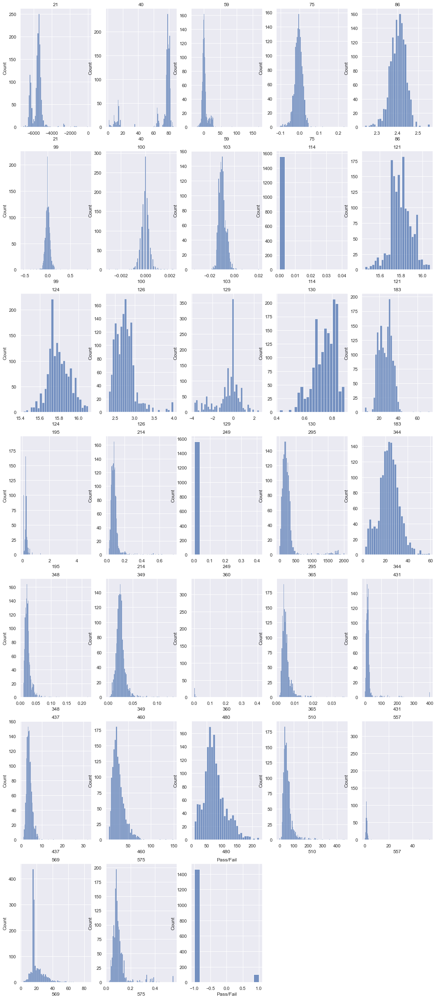

In [17]:
a = 8  # number of rows
b = 5  # number of columns
c=1

fig = plt.figure(figsize=(18,50))

for i in newdf.columns:
    
    plt.subplot(a, b, c)
    plt.xlabel(i)
    plt.title(i)
    sns.histplot(newdf[i]);
    c=c+1

- Pass/Fail is **highly unbalanced**
- '569' column has a high count for a particular value 
- '480','486','431' seem normal in nature
- others are skewed


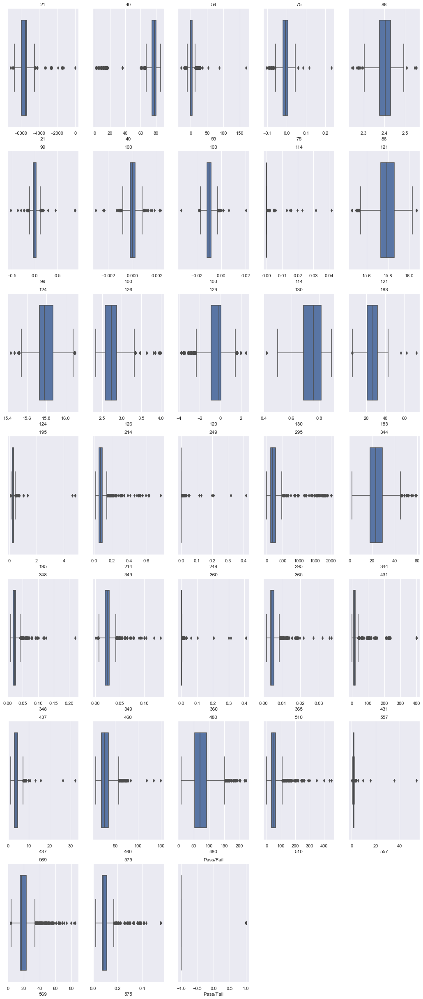

In [18]:
a = 8  # number of rows
b = 5  # number of columns
c=1

fig = plt.figure(figsize=(18,50))

for i in newdf.columns:
    
    plt.subplot(a, b, c)
    plt.xlabel(i)
    plt.title(i)
    sns.boxplot(x=newdf[i]);
    c=c+1

- All the features have few outliers
- in many of these features, the number of outliers is very high
- pass/fail is unbalanced

#### 3.2 Bi and multi variate analysis

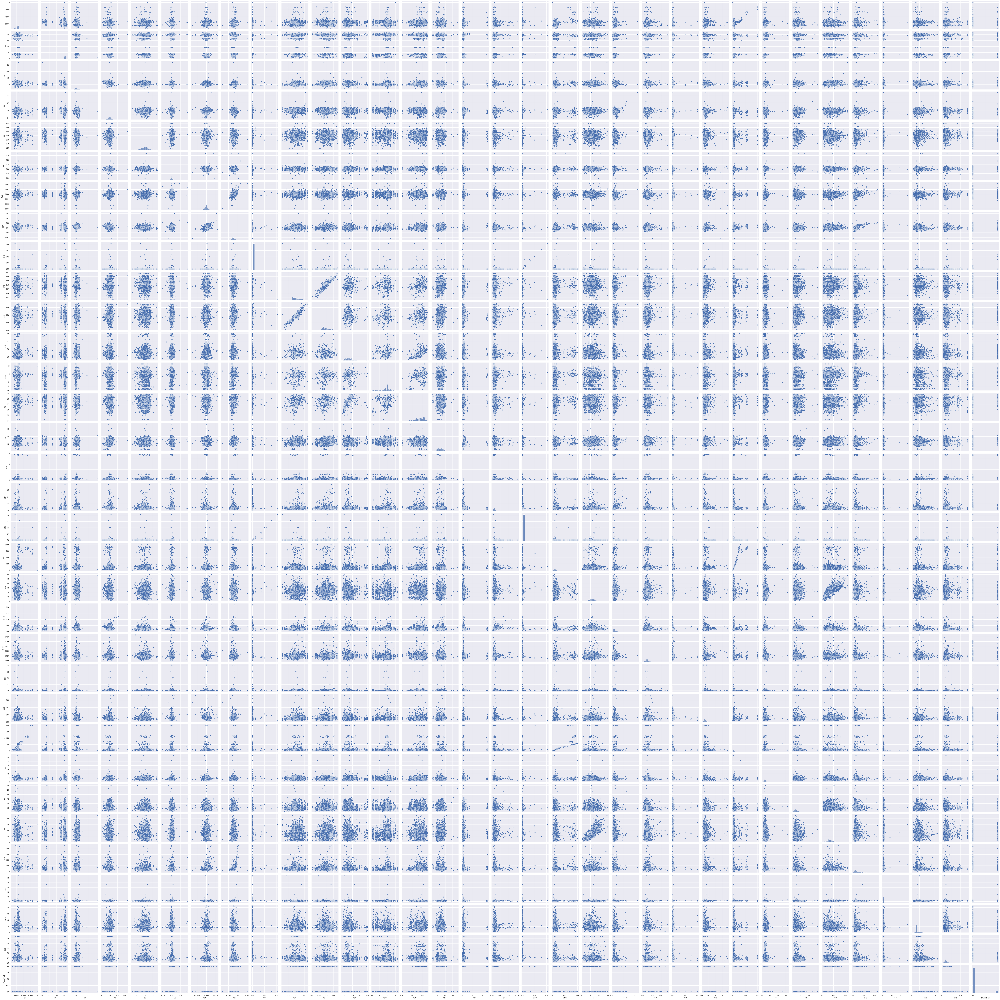

In [17]:
sns.pairplot(newdf)

- '124' vs '121' have very high correlation

In [19]:
newdf

,21,40,59,75,86,99,100,103,114,121,...,365,431,437,460,480,510,557,569,575,Pass/Fail
0,-5419.00,61.29,-1.7264,0.0126,2.3895,-0.0251,0.0002,-0.0042,0.0,15.88,...,0.0170,33.1562,3.1136,29.9394,115.7408,64.6707,1.0297,16.98835,0.1026,-1
1,-5441.50,78.25,0.8073,-0.0039,2.3754,-0.0158,-0.0004,-0.0045,0.0,15.88,...,0.0053,2.2655,3.2153,40.4475,163.0249,141.4365,1.7819,16.98835,0.0772,-1
2,-5447.75,14.37,23.8245,-0.0078,2.4532,0.1218,0.0006,-0.0026,0.0,15.90,...,0.0054,29.1663,3.1281,32.3594,93.9245,240.7767,1.1386,68.84890,0.0640,1
3,-5468.25,76.90,24.3791,-0.0555,2.4004,-0.0195,-0.0002,-0.0059,0.0,15.55,...,0.0046,13.4051,2.7013,27.6824,149.4399,113.5593,54.2917,25.03630,0.0525,-1
4,-5476.25,76.39,-12.2945,-0.0534,2.4530,-0.0167,0.0004,-0.0045,0.0,15.75,...,0.0063,10.7390,6.2069,30.8924,140.1953,148.0663,2.5014,16.98835,0.0706,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,-5418.75,81.21,2.8182,-0.0063,2.3762,0.0884,0.0000,-0.0094,0.0,15.69,...,0.0033,12.8067,8.2930,52.6790,65.0293,53.1915,1.0367,15.46620,0.0785,-1
1563,-6408.75,79.43,-3.3555,-0.0063,2.4880,-0.0372,-0.0004,-0.0116,0.0,15.92,...,0.0114,4.1273,3.7065,18.5401,115.6908,29.4372,1.8156,20.91180,0.1213,-1
1564,-5153.25,82.03,1.1664,-0.0063,2.4590,-0.0177,-0.0001,-0.0142,0.0,15.79,...,0.0040,20.0222,4.4902,37.7546,61.1973,54.8330,2.0228,29.09540,0.1352,-1
1565,-5271.75,81.13,4.4682,-0.0063,2.3600,0.1451,0.0004,-0.0087,0.0,15.72,...,0.0059,9.4153,3.1201,29.2827,60.7543,78.4993,1.8156,15.46620,0.1040,-1


### 4. Model training and cross validation

- This was performed on logistic regression algorithm

In [20]:
# from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

import warnings
warnings.filterwarnings('ignore')

X = newdf.drop(['Pass/Fail'],axis=1)
Y = newdf['Pass/Fail']
kfold = KFold(n_splits=10, random_state=5,shuffle=True)
model_lr = LogisticRegression()
results_lr = cross_val_score(model_lr, X, Y, cv=kfold)
print(results_lr)
print('_____________________________________________')
print("|Accuracy: %.3f%% (%.3f%%)|" % (results_lr.mean()*100.0, results_lr.std()*100.0))


[0.92993631 0.91082803 0.91082803 0.94904459 0.95541401 0.91719745
 0.91082803 0.91666667 0.94230769 0.94871795]
_____________________________________________
|Accuracy: 92.918% (1.717%)|


In [21]:
import warnings
warnings.filterwarnings('ignore')

X = newdf.drop(['Pass/Fail'],axis=1)
Y = newdf['Pass/Fail']
kfold = KFold(n_splits=10, random_state=5,shuffle=True)
model_lr = LogisticRegression()
results_lr = cross_val_score(model_lr, X, Y, cv=kfold)
print(results_lr)
print('_____________________________________________')
print("|Accuracy: %.3f%% (%.3f%%)|" % (results_lr.mean()*100.0, results_lr.std()*100.0))

[0.92993631 0.91082803 0.91082803 0.94904459 0.95541401 0.91719745
 0.91082803 0.91666667 0.94230769 0.94871795]
_____________________________________________
|Accuracy: 92.918% (1.717%)|


In [22]:
#Leave one out cross validation

kfold = KFold(n_splits=1567, random_state=5,shuffle=True)
model_lr = LogisticRegression()
results_lr = cross_val_score(model_lr, X, Y, cv=kfold)
print(results_lr)
print('_____________________________________________')
print("|Accuracy: %.3f%% (%.3f%%)|" % (results_lr.mean()*100.0, results_lr.std()*100.0))

[1. 1. 1. ... 1. 1. 1.]
_____________________________________________
|Accuracy: 92.725% (25.973%)|


- K-Fold cross validation and LOOCV yield same result on the logistic regression algorithm

### 5. Model Tuning - Logistic Regression

In [23]:
from sklearn.model_selection import RandomizedSearchCV

param_dist = {"penalty": ['l1', 'l2', 'elasticnet', 'none'],
              "tol": np.linspace(0.0001,1,200),
              "C": np.linspace(0.1,10,200),
              "max_iter": range(20,150),
              "solver": ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}
randomCV = RandomizedSearchCV(model_lr, param_distributions=param_dist, n_iter=150)

randomCV.fit(X, Y)

 
print(randomCV.best_params_)
print(randomCV.best_score_)
model_name = []
model_name.append('Logistic Regression')
score_list = []
score_list.append(randomCV.best_score_)
print(model_name,score_list)

{'tol': 0.22620804020100505, 'solver': 'sag', 'penalty': 'l2', 'max_iter': 47, 'C': 7.910552763819096}
0.934268736899941
['Logistic Regression'] [0.934268736899941]


#### With scaling

In [24]:
# logistic regression
from sklearn.decomposition import PCA 
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

pipe_mmx_lr = Pipeline([('scl',StandardScaler()), ('lr',LogisticRegression())])

param_dist = {"lr__penalty": ['l1', 'l2', 'elasticnet', 'none'],
              "lr__tol": np.linspace(0.0001,1,200),
              "lr__C": np.linspace(0.1,10,200),
              "lr__max_iter": range(20,150),
              "lr__solver": ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}

randomCV_lr = RandomizedSearchCV(pipe_mmx_lr, param_distributions=param_dist, n_iter=150, cv=10)
randomCV_lr.fit(X, Y)

 
print(randomCV_lr.best_params_)
print(randomCV_lr.best_score_)

{'lr__tol': 0.7437442211055277, 'lr__solver': 'saga', 'lr__penalty': 'l1', 'lr__max_iter': 139, 'lr__C': 6.517587939698492}
0.9317246447819695


#### With scaling and PCA

In [25]:
pipe_mmx_pca_lr = Pipeline([('scl',StandardScaler()),('pca',PCA(n_components=5)), ('lr',LogisticRegression())])

param_dist = {"lr__penalty": ['l1', 'l2', 'elasticnet', 'none'],
              "lr__tol": np.linspace(0.0001,1,200),
              "lr__C": np.linspace(0.1,10,200),
              "lr__max_iter": range(20,150),
              "lr__solver": ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}

randomCV_lr = RandomizedSearchCV(pipe_mmx_pca_lr, param_distributions=param_dist, n_iter=150, cv=10)
randomCV_lr.fit(X, Y)

 
print(randomCV_lr.best_params_)
print(randomCV_lr.best_score_)

{'lr__tol': 0.7939904522613066, 'lr__solver': 'sag', 'lr__penalty': 'l2', 'lr__max_iter': 141, 'lr__C': 9.651758793969849}
0.9323615874571288


### 6. Model Tuning - Naive Baye's (Gaussian) Model

In [26]:
from sklearn.naive_bayes import GaussianNB
GaussianNB().get_params().keys()

dict_keys(['priors', 'var_smoothing'])

In [27]:
from sklearn.naive_bayes import GaussianNB
gnb =  GaussianNB()

param_dist = {"var_smoothing": np.linspace(0.0000000001,0.00001,200)}
              
randomCV = RandomizedSearchCV(gnb, param_distributions=param_dist, n_iter=150,cv=10)

randomCV.fit(X, Y)

 
print(randomCV.best_params_)
print(randomCV.best_score_)

{'var_smoothing': 2.3618854271356785e-06}
0.9017842560836191


#### With scaling

In [28]:
pipe_gb = Pipeline([('scl',StandardScaler()), ('gnb',GaussianNB())])
param_dist = {"gnb__var_smoothing": np.linspace(0.0000000001,0.00001,200)}

randomCV = RandomizedSearchCV(pipe_gb, param_distributions=param_dist, n_iter=150,cv=10)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)

{'gnb__var_smoothing': 2.562888442211055e-06}
0.8794749305895803


#### With scaling and PCA

In [29]:
pipe_gb = Pipeline([('scl',StandardScaler()),('pca',PCA(n_components=5)), ('gnb',GaussianNB())])
param_dist = {"gnb__var_smoothing": np.linspace(0.0000000001,0.00001,200)}
randomCV = RandomizedSearchCV(pipe_gb, param_distributions=param_dist, n_iter=150,cv=10)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)


model_name.append('Gaussian model')

score_list.append(randomCV.best_score_)

{'gnb__var_smoothing': 5.326679899497488e-06}
0.9151600522619632


###  7. Model Tuning - Decision Tree Model

In [30]:
from sklearn.tree import DecisionTreeClassifier
dtc =  DecisionTreeClassifier()

In [31]:
param_dist = {'criterion':["gini", "entropy"],
                'splitter':["best", "random"],
                'max_depth':range(2,30),
                'min_samples_split':range(1,20),
                'min_samples_leaf':range(1,10),
                'max_features':range(1,30)}
              
randomCV = RandomizedSearchCV(dtc, param_distributions=param_dist, n_iter=150,cv=10)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)
model_name.append('DecisionTreeClassifier')

score_list.append(randomCV.best_score_)

{'splitter': 'random', 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 16, 'max_depth': 4, 'criterion': 'gini'}
0.9349175240894987


#### With scaling

In [32]:
param_dist = {  'dtc__criterion':["gini", "entropy"],
                'dtc__max_depth':range(2,30),
                'dtc__min_samples_split':range(1,20),
                'dtc__min_samples_leaf':range(1,10),
                'dtc__max_features':range(1,30)}
pipe_dtc = Pipeline([('scl',StandardScaler()), ('dtc',DecisionTreeClassifier())])              
randomCV = RandomizedSearchCV(pipe_dtc, param_distributions=param_dist, n_iter=150,cv=10)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)

{'dtc__min_samples_split': 11, 'dtc__min_samples_leaf': 6, 'dtc__max_features': 10, 'dtc__max_depth': 2, 'dtc__criterion': 'entropy'}
0.9336354728074474


#### With scaling and PCA

In [33]:
param_dist = {  'dtc__criterion':["gini", "entropy"],
                'dtc__max_depth':range(2,30),
                'dtc__min_samples_split':range(1,20),
                'dtc__min_samples_leaf':range(1,10),
                'dtc__max_features':range(1,30)}
pipe_dtc = Pipeline([('scl',StandardScaler()),('pca',PCA(n_components=5)), ('dtc',DecisionTreeClassifier())])              
randomCV = RandomizedSearchCV(pipe_dtc, param_distributions=param_dist, n_iter=150,cv=10)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)

{'dtc__min_samples_split': 14, 'dtc__min_samples_leaf': 4, 'dtc__max_features': 2, 'dtc__max_depth': 4, 'dtc__criterion': 'entropy'}
0.9298178997223582


### 8. Model Tuning - K nearest neighbour model

In [34]:
from sklearn.neighbors import KNeighborsClassifier
knc = KNeighborsClassifier()

In [35]:
param_dist = {'n_neighbors':range(2,13),
                "weights":['uniform', 'distance'],
                "leaf_size":range(1,30),
                'p':range(1,20),
                "metric":['minkowski','euclidean','manhattan','chebyshev']}
              

randomCV = RandomizedSearchCV(knc, param_distributions=param_dist, n_iter=150,cv=10)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)

{'weights': 'uniform', 'p': 8, 'n_neighbors': 12, 'metric': 'minkowski', 'leaf_size': 9}
0.9336354728074474


#### With scaling

In [36]:
pipe_k = Pipeline([('scl',StandardScaler()), ('knc',KNeighborsClassifier())]) 

param_dist = {'knc__n_neighbors':range(2,13),
                "knc__weights":['uniform', 'distance'],
                "knc__leaf_size":range(1,30),
                'knc__p':range(1,20),
                "knc__metric":['minkowski','euclidean','manhattan','chebyshev']}

randomCV = RandomizedSearchCV(pipe_k, param_distributions=param_dist, n_iter=150,cv=10)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)

{'knc__weights': 'uniform', 'knc__p': 15, 'knc__n_neighbors': 10, 'knc__metric': 'euclidean', 'knc__leaf_size': 26}
0.9336354728074474


#### With scaling and PCA

In [37]:
pipe_k = Pipeline([('scl',StandardScaler()),('pca',PCA(n_components=5)), ('knc',KNeighborsClassifier())]) 

param_dist = {'knc__n_neighbors':range(2,13),
                "knc__weights":['uniform', 'distance'],
                "knc__leaf_size":range(1,30),
                'knc__p':range(1,20),
                "knc__metric":['minkowski','euclidean','manhattan','chebyshev']}

randomCV = RandomizedSearchCV(pipe_k, param_distributions=param_dist, n_iter=150,cv=10)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)
model_name.append('K neighbour model')

score_list.append(randomCV.best_score_)

{'knc__weights': 'uniform', 'knc__p': 9, 'knc__n_neighbors': 6, 'knc__metric': 'euclidean', 'knc__leaf_size': 17}
0.9336395557733137


### 9. Model Tuning - Random Forest classifier

In [39]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier()
param_dist = {'n_estimators':range(2,120),
                'criterion':['gini','entropy'],
                'min_samples_leaf':range(2,10)}
              

randomCV = RandomizedSearchCV(rfc, param_distributions=param_dist, n_iter=100,cv=5)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)

{'n_estimators': 94, 'min_samples_leaf': 8, 'criterion': 'entropy'}
0.931720966199304


#### With scaling

In [40]:
pipe_rfc = Pipeline([('scl',StandardScaler()), ('rfc',RandomForestClassifier())])
param_dist = {'rfc__n_estimators':range(2,120),
                'rfc__criterion':['gini','entropy'],
                'rfc__min_samples_leaf':range(2,10)}
              

randomCV = RandomizedSearchCV(pipe_rfc, param_distributions=param_dist, n_iter=100,cv=5)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)

{'rfc__n_estimators': 79, 'rfc__min_samples_leaf': 9, 'rfc__criterion': 'gini'}
0.9323579088744633


#### With scaling and PCA

In [42]:
pipe_rfc = Pipeline([('scl',StandardScaler()),('pca',PCA(n_components=5)), ('rfc',RandomForestClassifier())])
param_dist = {'rfc__n_estimators':range(2,120),
                'rfc__criterion':['gini','entropy'],
                'rfc__min_samples_leaf':range(2,10)}
              

randomCV = RandomizedSearchCV(pipe_rfc, param_distributions=param_dist, n_iter=100,cv=5)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)

model_name.append('Random Forest model')

score_list.append(randomCV.best_score_)

{'rfc__n_estimators': 66, 'rfc__min_samples_leaf': 7, 'rfc__criterion': 'entropy'}
0.9336317942247817


### 10. Model Tuning - Bagging Classifer model

In [49]:
from sklearn.ensemble import BaggingClassifier
bgclf = BaggingClassifier()
param_dist = {'n_estimators':range(2,50),
              'max_features':range(1,50),
                'max_samples':range(1,70)}
              

randomCV = RandomizedSearchCV(bgclf, param_distributions=param_dist, n_iter=100,cv=5)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)

model_name.append('Bagging classifier model')

score_list.append(randomCV.best_score_)

{'n_estimators': 24, 'max_samples': 34, 'max_features': 16}
0.9336317942247817


#### With scaling

In [47]:
param_dist = {'bgfcl__n_estimators':range(2,50),
              'bgfcl__max_features':range(1,50),
                'bgfcl__max_samples':range(1,70)}
              
pipe_bgclf = Pipeline([('scl',StandardScaler()), ('bgfcl',BaggingClassifier())])
randomCV = RandomizedSearchCV(pipe_bgclf, param_distributions=param_dist, n_iter=100,cv=5)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)

{'bgfcl__n_estimators': 12, 'bgfcl__max_samples': 48, 'bgfcl__max_features': 7}
0.9342707718605645


#### With scaling and PCA

In [48]:
param_dist = {'bgfcl__n_estimators':range(2,50),
              'bgfcl__max_features':range(1,50),
                'bgfcl__max_samples':range(1,70)}
              
pipe_bgclf = Pipeline([('scl',StandardScaler()), ('pca',PCA(n_components=5)), ('bgfcl',BaggingClassifier())])
randomCV = RandomizedSearchCV(pipe_bgclf, param_distributions=param_dist, n_iter=100,cv=5)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)

{'bgfcl__n_estimators': 18, 'bgfcl__max_samples': 37, 'bgfcl__max_features': 2}
0.9336317942247817


### 11. Model Tuning - Boosting classifier model

In [50]:
from sklearn.ensemble import AdaBoostClassifier
adclf = AdaBoostClassifier()
param_dist = {'n_estimators':range(2,50)}
              

randomCV = RandomizedSearchCV(adclf, param_distributions=param_dist, n_iter=100,cv=5)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)


{'n_estimators': 6}
0.8922305203394314


In [51]:
model_name.append('Boosting classifier model')

score_list.append(randomCV.best_score_)

### 12. Model Tuning - Gradient boost classifier

In [52]:
from sklearn.ensemble import GradientBoostingClassifier
gbclf = GradientBoostingClassifier()
param_dist = {'n_estimators':range(2,50),
             'loss':['deviance', 'exponential'],
             'learning_rate':range(1,10)}
              

randomCV = RandomizedSearchCV(gbclf, param_distributions=param_dist, n_iter=100,cv=5)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)

{'n_estimators': 13, 'loss': 'exponential', 'learning_rate': 6}
0.9075191795038766


In [53]:
model_name.append('Gradient_Boos classifier model')

score_list.append(randomCV.best_score_)

### 13. Model Tuning - Linear regression

In [57]:
from sklearn.linear_model import LinearRegression

lre = LinearRegression()

param_dist = {'fit_intercept':[True,False],
             'normalize':[True,False]}

randomCV = RandomizedSearchCV(lre,param_distributions=param_dist, n_iter=100,cv=5)
randomCV.fit(X, Y)
 
print(randomCV.best_params_)
print(randomCV.best_score_)

{'normalize': True, 'fit_intercept': True}
-0.005347150778651999


In [58]:
model_name.append('Linear model')

score_list.append(randomCV.best_score_)

### 14. MODEL EVALUATION

In [64]:
print('Model Name                     Score')
print('==================================')
for i,j in zip(model_name,score_list):
    print(i,' : ',j)
    

Model Name                     Score
Logistic Regression  :  0.934268736899941
Gaussian model  :  0.9151600522619632
DecisionTreeClassifier  :  0.9349175240894987
K neighbour model  :  0.9336395557733137
Random Forest model  :  0.9336317942247817
Bagging classifier model  :  0.9336317942247817
Boosting classifier model  :  0.8922305203394314
Gradient_Boos classifier model  :  0.9075191795038766
Linear model  :  -0.005347150778651999


#### 14.1  Picking the best Model

- **Decision tree classifier** fits as the best model with parameters
- 'splitter': 'random', 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 16, 'max_depth': 4, 'criterion': 'gini'
- Decision tree is not an overfit as the max_depth and min_samples_leaf are not reaching their maximum values
- The propencity of Decision tree model can be analysed by observing high accuracy in random forest model too.


### 15. Testing future data

In [124]:
future = pd.read_excel('Future_predictions.xlsx')
future.head(10)

,Time,0,1,2,3,4,5,6,7,8,...,580,581,582,583,584,585,586,587,588,589
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100,97.6133,0.1242,1.5005,...,NaN,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100,102.3433,0.1247,1.4966,...,0.0060,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100,95.4878,0.1241,1.4436,...,0.0148,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100,104.2367,0.1217,1.4882,...,0.0044,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100,100.3967,0.1235,1.5031,...,NaN,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432
5,2008-07-19 17:53:00,2946.25,2432.84,2233.3667,1326.5200,1.5334,100,100.3967,0.1235,1.5287,...,0.0052,44.0077,0.4949,0.0189,0.0044,3.8276,0.0342,0.0151,0.0052,44.0077
6,2008-07-19 19:44:00,3030.27,2430.12,2230.4222,1463.6606,0.8294,100,102.3433,0.1247,1.5816,...,NaN,NaN,0.5010,0.0143,0.0042,2.8515,0.0342,0.0151,0.0052,44.0077
7,2008-07-19 19:45:00,3058.88,2690.15,2248.9000,1004.4692,0.7884,100,106.2400,0.1185,1.5153,...,0.0063,95.0310,0.4984,0.0106,0.0034,2.1261,0.0204,0.0194,0.0063,95.0310
8,2008-07-19 20:24:00,2967.68,2600.47,2248.9000,1004.4692,0.7884,100,106.2400,0.1185,1.5358,...,0.0045,111.6525,0.4993,0.0172,0.0046,3.4456,0.0111,0.0124,0.0045,111.6525
9,2008-07-19 21:35:00,3016.11,2428.37,2248.9000,1004.4692,0.7884,100,106.2400,0.1185,1.5381,...,0.0073,90.2294,0.4967,0.0152,0.0038,3.0687,0.0212,0.0191,0.0073,90.2294


In [125]:
future.shape

(18, 591)

In [126]:
future.drop('Time',axis=1, inplace=True)
future.shape

(18, 590)

In [127]:
future.dtypes

0      float64
1      float64
2      float64
3      float64
4      float64
        ...   
585    float64
586    float64
587    float64
588    float64
589    float64
Length: 590, dtype: object

In [128]:
future.isnull().sum().sum()

520

In [129]:
for i in future.columns:
    future[i]=future[i].fillna(0)
    
future.isnull().sum().sum()

0

In [130]:
df.select_dtypes(exclude=np.number)

""
0
1
2
3
4
...
1562
1563
1564
1565


In [157]:
dtc_f = DecisionTreeClassifier(splitter= 'random', 
                               min_samples_split= 9, min_samples_leaf= 4, 
                               max_features=16, max_depth=4, 
                               criterion= 'gini')

# fitting model on original dataset

Xo = df.drop(['Pass/Fail'],axis=1)
Yo = df['Pass/Fail']
dtc_f.fit(Xo,Yo)
dtc_f.score(Xo,Yo)

0.9336311423101468

- A good score is also observed in the original data

### 15.1 Prediction

In [158]:
yf=dtc_f.predict(future)
p1 = pd.DataFrame(yf)
p1

,0
0,-1
1,-1
2,-1
3,-1
4,-1
5,-1
6,-1
7,-1
8,-1
9,-1


In [159]:
p1.value_counts(normalize=True)

-1    1.0
dtype: float64

- All the predictions were made as -1 or Pass by the best fit decision classifier

### 16. Handling impbalanced data - SMOTE

In [ ]:
!pip install imblearn

In [160]:

from imblearn.over_sampling import SMOTE

sm = SMOTE(sampling_strategy = 1 ,k_neighbors = 5, random_state=1)
X_up, Y_up = sm.fit_resample(Xo,Yo)

print("Before UpSampling, counts of label '-1 (pass)': {}".format(sum(Yo==-1)))
print("Before UpSampling, counts of label '1 (fail)': {} \n".format(sum(Yo==1)))

print("After UpSampling, counts of label '-1 (pass)': {}".format(sum(Y_up==-1)))
print("After UpSampling, counts of label '1 (fail)': {} \n".format(sum(Y_up==1)))

Before UpSampling, counts of label '-1 (pass)': 1463
Before UpSampling, counts of label '1 (fail)': 104 

After UpSampling, counts of label '-1 (pass)': 1463
After UpSampling, counts of label '1 (fail)': 1463 



In [161]:
dtc_f.fit(X_up,Y_up)
dtc_f.score(X_up,Y_up)

0.618591934381408

- The accuracy decreased to almost 62% after oversampling under SMOTE technique

In [162]:
yf=dtc_f.predict(future)
p2=pd.DataFrame(yf)
p2

,0
0,1
1,1
2,1
3,1
4,-1
5,1
6,-1
7,1
8,1
9,-1


In [163]:
p2.value_counts(normalize=True)

 1    0.666667
-1    0.333333
dtype: float64

- The prediction after applying SMOTE predicted pass as 33% and fail as 67%

### 17. CONCLUSION

- The model had 580 dimensions initially and the dimenionlaity reduction was done using lasso regression.
- **36 features** were picked for model evaluation and visualisation.
- Columns had  ranges of values
- pass/fail column was highly **unbalanced** (as 75% quantile is -1 and max is 1)
- **Numerous models were trained** for the datset obtained
- Accuracies were calculated by **normal tuning, scaling and PCA** the best accuracy of these was stored in score list
- Score list was:

##### Model Name    ________   :      ______                        Score

- Logistic Regression  :  0.9342
- Gaussian model  :  0.9151
- DecisionTreeClassifier  :  0.9349
- K neighbour model  :  0.933
- Random Forest model  :  0.933
- Bagging classifier model  :  0.9336
- Boosting classifier model  :  0.892
- Gradient_Boos classifier model  :  0.907
- Linear model  :  -0.005

##### Final model analysis

- **Decision tree** was chosen as the best model
- with 'splitter': 'random', 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 16, 'max_depth': 4, 'criterion': 'gini'
- Future array prediction with this model was 100% pass (-1)

- **SMOTE technique** was then applied to handle the **imablanced data**.
- Future array prediction with this model was pass (-1) as 33% and fail (1) as 67%

##### THANK YOU


 ------------------------------------------------------ END -----------------------------------------------------------------